# **Набор данных для классификации качества воды**

# Текстовое описание задачи

*Это набор данных о качестве воды, собранный в городской среде. Он включает в себя различные признаки, например, наличие в воде каких-либо бактерий, хлора, чего похуже и т.д.. В зависимости от того, что мы обнаружим, мы сможем определить, пригодна ли эта вода для использования.*

# Чтение данных

Подключаем библиотеки

In [2]:
import numpy as np              # Массивы 
import matplotlib.pyplot as plt # Графика
import pandas as pd             # Таблицы  
import seaborn as sns           # Визуализация
import sklearn                  # Алгоритмы машинного обучения         

Загружаем данные

In [3]:
url = 'https://raw.githubusercontent.com/MBarysheva/machine_learning/main/WaterQuality.csv'
data = pd.read_csv(url)

Прочтем загруженные данные

In [ ]:
data.shape

(7999, 21)

В датасете содержатся данные о 7999 объектах, разделенные на 20 категорий(признаков):

In [ ]:
data

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7994,0.05,7.78,0.00,1.95,0.040,0.10,0.03,0.03,1.37,0.00,...,0.197,14.29,1.00,0.005,3.57,2.13,0.09,0.06,0.03,1
7995,0.05,24.22,0.02,0.59,0.010,0.45,0.02,0.02,1.48,0.00,...,0.031,10.27,1.00,0.001,1.48,1.11,0.09,0.10,0.08,1
7996,0.09,6.85,0.00,0.61,0.030,0.05,0.05,0.02,0.91,0.00,...,0.182,15.92,1.00,0.000,1.35,4.84,0.00,0.04,0.05,1
7997,0.01,10,0.01,2.00,0.000,2.00,0.00,0.09,0.00,0.00,...,0.000,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.00,1


Рассмотрим столбцы, отвечающие за признаки:

In [ ]:
data.columns

Index(['aluminium', 'ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine',
       'chromium', 'copper', 'flouride', 'bacteria', 'viruses', 'lead',
       'nitrates', 'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium',
       'silver', 'uranium', 'is_safe'],
      dtype='object')

Рассмотрим столбцы, отвечающие за признаки. Данные признаки показывают уровень содержания данного вещества в воде на литр (мг/л). Справа от них написаны наибольшие безопасные значения. Текстовых признаков нет. 


*   Содержание алюминия в воде 2,8
*   Содержание аммиака в воде 32,5
*   Содержание мышьяка в воде 0,01
*   Содержание бария в воде 2
*   Содержание кадмия в воде 0,005
*   Содержание хлорамина в воде 4
*   Содержание хрома в воде 0,1
*   Содержание меди в воде 1,3
*   Содержание фторида в воде 1,5
*   Содержание бактерий в воде 0
*   Содержание вирусов в воде 0
*   Содержание свинца в воде 0,015
*   Содержание нитратов в воде 10
*   Содержание нитритов в воде 1
*   Содержание ртути в воде 0,002
*   Содержание перхлората в воде 56
*   Содержание радия(!!!!) в воде 5
*   Содержание селена в воде 0,5
*   Содержание серебра в воде 0,1
*   Содержание урана(!!!!) в воде 0,3

По количественному содержанию того или иного признака мы сможем сказать, безопасна вода или нет: is_safe — класс объекта {0 — небезопасно, 1 — безопасно}







# Визуализация данных и вычисление основных характеристик

### Получим информацию о количественных признаках

In [ ]:
data.describe()

,aluminium,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium
count,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000
mean,0.666158,0.161445,1.567715,0.042806,2.176831,0.247226,0.805857,0.771565,0.319665,0.328583,0.099450,9.818822,1.329961,0.005194,16.460299,2.920548,0.049685,0.147781,0.044673
std,1.265145,0.252590,1.216091,0.036049,2.567027,0.270640,0.653539,0.435373,0.329485,0.378096,0.058172,5.541331,0.573219,0.002967,17.687474,2.323009,0.028770,0.143551,0.026904
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.040000,0.030000,0.560000,0.008000,0.100000,0.050000,0.090000,0.405000,0.000000,0.002000,0.048000,5.000000,1.000000,0.003000,2.170000,0.820000,0.020000,0.040000,0.020000
50%,0.070000,0.050000,1.190000,0.040000,0.530000,0.090000,0.750000,0.770000,0.220000,0.008000,0.102000,9.930000,1.420000,0.005000,7.740000,2.410000,0.050000,0.080000,0.050000
75%,0.280000,0.100000,2.480000,0.070000,4.240000,0.440000,1.390000,1.160000,0.610000,0.700000,0.151000,14.610000,1.760000,0.008000,29.480000,4.670000,0.070000,0.240000,0.070000
max,5.050000,1.050000,4.940000,0.130000,8.680000,0.900000,2.000000,1.500000,1.000000,1.000000,0.200000,19.830000,2.930000,0.010000,60.010000,7.990000,0.100000,0.500000,0.090000


* Count — Количество значений для каждого признака. Заметим, что для всех признаков это число однаково. То есть, эти признаки не имеют пропущенных значений. Однако, здесь не указан признак "is_safe", поэтому о полном отсутсвии пропусков говорить рано.
* Mean — Средние значения.
* STD — Стандартные отклонения. Данная константа показывает, на сколько в среднем отклоняются варианты от среднего значения.
* Min — Минимальные значения.
* Max — Максимальные значения.
* 25% — Значения, которые объект не превышает с вероятностью 25%.
* 75% — Значения, которые объект не превышает с вероятностью 75%.
* 50% — Медиана.

Построим диаграмму рассеивания для указанных признаков.

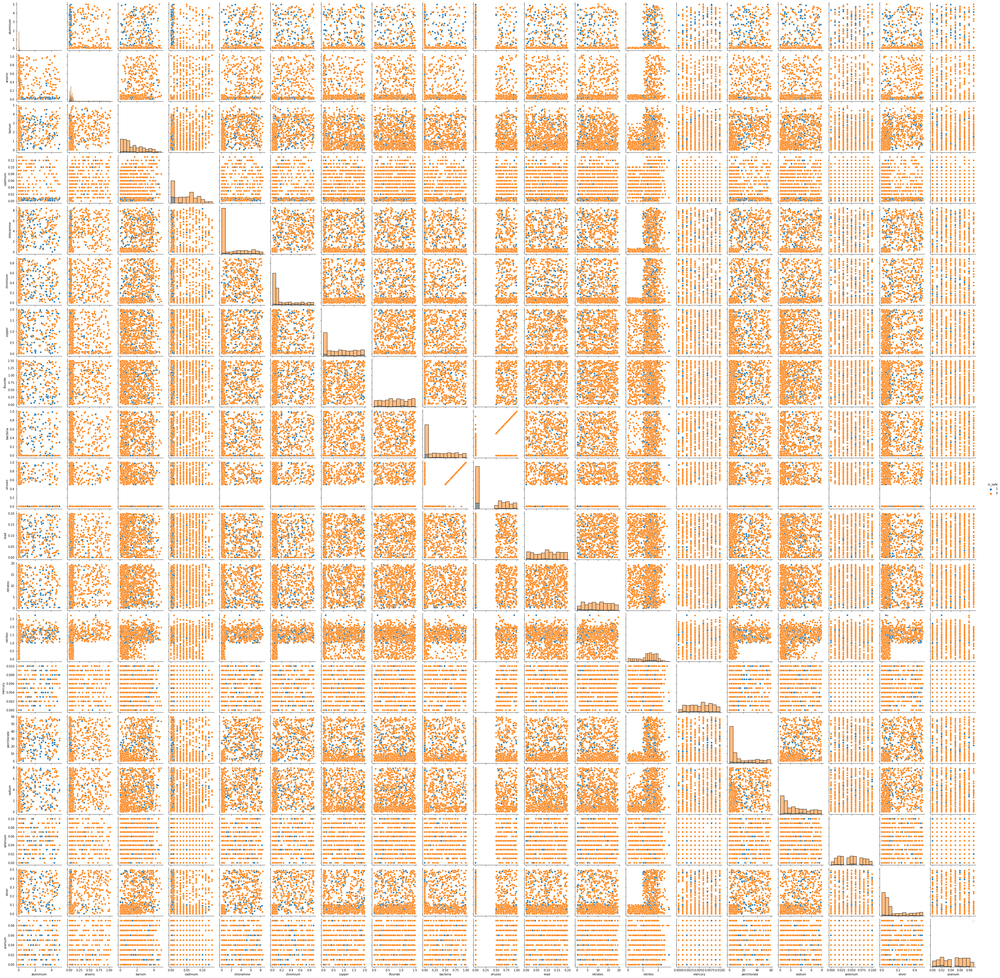

In [ ]:
sns.pairplot(data.iloc[np.random.choice(np.arange(data.shape[0]), size=1000, replace=False)], hue='is_safe', diag_kind='hist')
plt.legend()
pass

Из диаграммы видно, что признаки между собой не коррелируют. 
Построим матрицу корреляции для заданных признаков и ее визуальное представление. 

In [ ]:
data.corr().where(np.triu(data.corr() > 0.3, k = 1)).stack().sort_values(ascending = False)

bacteria     viruses        0.618480
chloramine   perchlorate    0.588769
             chromium       0.555938
chromium     perchlorate    0.524532
chloramine   silver         0.522447
chromium     silver         0.510768
perchlorate  silver         0.504604
barium       perchlorate    0.462234
             chloramine     0.446928
             silver         0.431606
             chromium       0.415972
chloramine   radium         0.388806
             nitrites       0.379685
perchlorate  radium         0.373028
aluminium    chloramine     0.369309
             perchlorate    0.363069
arsenic      barium         0.362945
             chloramine     0.356559
radium       silver         0.354006
aluminium    chromium       0.353218
nitrites     perchlorate    0.346172
chromium     nitrites       0.335708
aluminium    silver         0.334993
arsenic      cadmium        0.334682
nitrites     silver         0.332739
arsenic      perchlorate    0.332279
chromium     radium         0.315271
b

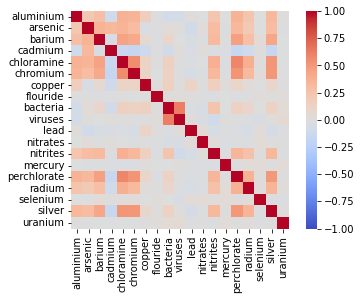

In [ ]:
sns.heatmap(data.corr(), square=True, vmin=-1, vmax=1, cmap='coolwarm')
pass

По матрице корреляции мы видим, что что сильнейшую связь образуют между собой бактерии и вирусы, так как их коэффициент корреляции составляет 0,62.

# Обработка категориальных признаков
Из приведенных выше данных мы видим, что все признаки являются количественными, но класс объекта является категориальным признаком, принимающим бинарные значения.

In [4]:
data['is_safe'] = data['is_safe'].astype('category')
data.describe(include=['category'])

,is_safe
count,7999
unique,3
top,0
freq,7084


Мы видим три уникальных значения, значит, в данном признаке у нас имеются пропуски.

# Обработка пропущенных значений

In [5]:
data['is_safe'].value_counts()

0        7084
1         912
#NUM!       3
Name: is_safe, dtype: int64

Действительно, у нас имеются три пропущенных значения, обработаем их.

In [6]:
data['is_safe']=data['is_safe'].map({'0':0,'1':1,'#NUM!':0})

amm=[]
for i in range(len(data)):
    s=data.loc[i,'ammonia']
    if s=='#NUM!':
        amm+=[0]
    else:
        amm+=[float(s)]
data['ammonia']=amm

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7999 entries, 0 to 7998
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   aluminium    7999 non-null   float64
 1   ammonia      7999 non-null   float64
 2   arsenic      7999 non-null   float64
 3   barium       7999 non-null   float64
 4   cadmium      7999 non-null   float64
 5   chloramine   7999 non-null   float64
 6   chromium     7999 non-null   float64
 7   copper       7999 non-null   float64
 8   flouride     7999 non-null   float64
 9   bacteria     7999 non-null   float64
 10  viruses      7999 non-null   float64
 11  lead         7999 non-null   float64
 12  nitrates     7999 non-null   float64
 13  nitrites     7999 non-null   float64
 14  mercury      7999 non-null   float64
 15  perchlorate  7999 non-null   float64
 16  radium       7999 non-null   float64
 17  selenium     7999 non-null   float64
 18  silver       7999 non-null   float64
 19  uraniu

Вызвав отображение всех типов данных после нашей расправы над пропусками, мы убедились в их отсутствии.

# Нормализация количественных признаков

Перед применением алгоритмов машинного обучения количественные признаки полезно нормализовать.
Выполним стандартизацию всех признаков. 

*Стандартизация - линейное преобразование, приводящее все значения к нулевому среднему и единичному стандартному отклонению*

In [7]:
numerical_columns = [c for c in data.columns if data[c].dtype.name != 'int64']
data_stand = (data[numerical_columns] - data[numerical_columns].mean(axis = 0))/data[numerical_columns].std(axis = 0)
data_stand.describe()

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium
count,7.999000e+03,7.999000e+03,7.999000e+03,7999.000000,7.999000e+03,7.999000e+03,7.999000e+03,7999.000000,7.999000e+03,7.999000e+03,7.999000e+03,7.999000e+03,7.999000e+03,7.999000e+03,7.999000e+03,7.999000e+03,7.999000e+03,7.999000e+03,7.999000e+03,7.999000e+03
mean,-1.421263e-16,8.527579e-17,5.685053e-17,0.000000,-1.421263e-16,-1.705516e-16,-1.137011e-16,0.000000,1.012650e-16,4.263789e-17,9.948842e-17,-1.421263e-17,-2.300670e-16,-3.411032e-16,-7.461631e-17,5.685053e-17,1.137011e-16,-2.411706e-16,5.685053e-17,-1.918705e-16
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-5.265469e-01,-1.616027e+00,-6.391579e-01,-1.289142,-1.187429e+00,-8.479967e-01,-9.134848e-01,-1.233066,-1.772195e+00,-9.701944e-01,-8.690460e-01,-1.709584e+00,-1.771925e+00,-2.320161e+00,-1.750398e+00,-9.306189e-01,-1.257226e+00,-1.726977e+00,-1.029466e+00,-1.660467e+00
25%,-4.949300e-01,-8.684115e-01,-5.203886e-01,-0.828651,-9.655111e-01,-8.090412e-01,-7.287378e-01,-1.095355,-8.419574e-01,-9.701944e-01,-8.637564e-01,-8.844426e-01,-8.696145e-01,-5.756282e-01,-7.393181e-01,-8.079333e-01,-9.042358e-01,-1.031806e+00,-7.508196e-01,-9.170813e-01
50%,-4.712173e-01,-1.608461e-02,-4.412090e-01,-0.310597,-7.784042e-02,-6.415322e-01,-5.809402e-01,-0.085468,-3.595071e-03,-3.024867e-01,-8.478874e-01,4.384110e-02,2.006335e-02,1.570755e-01,-6.526493e-02,-4.930211e-01,-2.197786e-01,1.095031e-02,-4.721732e-01,1.979978e-01
75%,-3.052284e-01,8.846571e-01,-2.432601e-01,0.750178,7.543508e-01,8.037192e-01,7.122887e-01,0.893815,8.921893e-01,8.811771e-01,9.823357e-01,8.861726e-01,8.646257e-01,7.502167e-01,9.458148e-01,7.360972e-01,7.530977e-01,7.061211e-01,6.424126e-01,9.413838e-01
max,3.465090e+00,1.752747e+00,3.517769e+00,2.773053,2.418733e+00,2.533346e+00,2.411961e+00,1.827195,1.673130e+00,2.064841e+00,1.775785e+00,1.728504e+00,1.806638e+00,2.791320e+00,1.619868e+00,2.462177e+00,2.182279e+00,1.748877e+00,2.453614e+00,1.684770e+00


# Разбиение классов на обучающую и тестовую выборку

Разобьем данные на обучающую и тестовую выборки (75% - обучающая выборка, 25% - тестовая):

In [8]:
dataX = data.drop('is_safe', axis=1)
dataY = data['is_safe']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(dataX, dataY, test_size = 0.25, random_state = 42)

N_train, _ = X_train.shape 
N_test,  _ = X_test.shape 

print('Size train: ',N_train)
print('Size test: ', N_test)

Size train:  5999
Size test:  2000


# Обучение модели

## Метод K-ближайших соседей

Попробуем сначала классификатор с количеством соседей по умолчанию (5):

In [24]:
from sklearn.neighbors import KNeighborsClassifier

knn_default = KNeighborsClassifier()
knn_default.fit(X_train, y_train)
knn_training_predict = knn_default.score(X_train, y_train)
knn_test_predict = knn_default.score(X_test, y_test)
err_train = np.mean(y_train != knn_default.predict(X_train))
err_test  = np.mean(y_test  != knn_default.predict(X_test))

print("Accuracy. Train : {:.2f}, Test: {:.2f}. ".format(knn_training_predict, knn_test_predict))
print("Error. Train : {:.2f}, Test: {:.2f}. ".format(err_train, err_test))


Accuracy. Train : 0.91, Test: 0.86. 
Error. Train : 0.09, Test: 0.14. 


Теперь 10 ближайших соседей:

In [25]:
knn_10 = KNeighborsClassifier(n_neighbors = 10)
knn_10.fit(X_train, y_train)
knn_training_predict = knn_10.score(X_train, y_train)
knn_test_predict = knn_10.score(X_test, y_test)
err_train = np.mean(y_train != knn_10.predict(X_train))
err_test  = np.mean(y_test  != knn_10.predict(X_test))

print("Accuracy. Train : {:.2f}, Test: {:.2f}. ".format(knn_training_predict, knn_test_predict))
print("Error. Train : {:.2f}, Test: {:.2f}. ".format(err_train, err_test))


Accuracy. Train : 0.90, Test: 0.87. 
Error. Train : 0.10, Test: 0.13. 


Видим, что точность полученной модели снизилась в тренировочной выборке, но увеличилась в тестовой. Попробуем найти оптимальное значение на бОльшем промежутке:


In [47]:
for i in [ 5, 6, 7, 8, 9, 10]:
    allknn = KNeighborsClassifier(n_neighbors = i)
    allknn.fit(X_train, y_train)
    knn_training_predict = allknn.score(X_train, y_train)
    knn_test_predict = allknn.score(X_test, y_test)
    err_train = np.mean(y_train != allknn.predict(X_train))
    err_test  = np.mean(y_test  != allknn.predict(X_test))
    y1 += [err_train]
    y2 += [err_test]
    print("N_neighbors:", i)
    print("Accuracy. Train : {:.3f}, Test: {:.3f}. ".format(knn_training_predict, knn_test_predict))
    print("Error. Train : {:.3f}, Test: {:.3f}. ".format(err_train, err_test))
    print(" ")


N_neighbors: 5
Accuracy. Train : 0.909, Test: 0.864. 
Error. Train : 0.091, Test: 0.136. 
 
N_neighbors: 6
Accuracy. Train : 0.898, Test: 0.873. 
Error. Train : 0.102, Test: 0.128. 
 
N_neighbors: 7
Accuracy. Train : 0.899, Test: 0.868. 
Error. Train : 0.101, Test: 0.133. 
 
N_neighbors: 8
Accuracy. Train : 0.896, Test: 0.874. 
Error. Train : 0.104, Test: 0.127. 
 
N_neighbors: 9
Accuracy. Train : 0.898, Test: 0.871. 
Error. Train : 0.102, Test: 0.129. 
 
N_neighbors: 10
Accuracy. Train : 0.896, Test: 0.874. 
Error. Train : 0.104, Test: 0.126. 
 


Мы получили усредненное значение при k = 7.

## Случайный лес




In [63]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(X_train, y_train)
y_train_predict = rf.predict(X_train)
y_test_predict = rf.predict(X_test)
rf_training_predict = rf.score(X_train, y_train)
rf_test_predict = rf.score(X_test, y_test)
err_train = np.mean(y_train != y_train_predict)
err_test  = np.mean(y_test  != y_test_predict)

print("Accuracy. Train : {:.3f}, Test: {:.3f}. ".format(rf_training_predict, rf_test_predict))
print("Error. Train : {:.3f}, Test: {:.3f}. ".format(err_train, err_test))

Accuracy. Train : 1.000, Test: 0.957. 
Error. Train : 0.000, Test: 0.043. 


## Алгоритм дерева решений
Возьмем дефолтное значение и рассмотрим точность модели.

In [60]:
from sklearn.tree import DecisionTreeClassifier

dct = DecisionTreeClassifier()
dct.fit(X_train,y_train)
dct_train_score = dct.score(X_train, y_train)
dct_test_score = dct.score(X_test, y_test)
y_train_predict = dct.predict(X_train)
y_test_predict = dct.predict(X_test)
err_train = np.mean(y_train != y_train_predict)
err_test  = np.mean(y_test  != y_test_predict)
print ('Tree Depth:', dct.get_depth())
print ('Tree Leaves:', dct.get_n_leaves())
print("Accuracy. Train : {:.3f}, Test: {:.3f}. ".format(dct_train_score, dct_test_score))
print("Error. Train : {:.3f}, Test: {:.3f}. ".format(err_train, err_test))

Tree Depth: 20
Tree Leaves: 177
Accuracy. Train : 1.000, Test: 0.949. 
Error. Train : 0.000, Test: 0.051. 


Теперь попробуем уменьшить глубину дерева до 10

In [61]:
dct = DecisionTreeClassifier(max_depth=10)
dct.fit(X_train,y_train)
dct_train_score = dct.score(X_train, y_train)
dct_test_score = dct.score(X_test, y_test)
y_train_predict = dct.predict(X_train)
y_test_predict = dct.predict(X_test)
err_train = np.mean(y_train != y_train_predict)
err_test  = np.mean(y_test  != y_test_predict)
print ('Tree Depth:', dct.get_depth())
print ('Tree Leaves:', dct.get_n_leaves())
print("Accuracy. Train : {:.3f}, Test: {:.3f}. ".format(dct_train_score, dct_test_score))
print("Error. Train : {:.3f}, Test: {:.3f}. ".format(err_train, err_test))

Tree Depth: 10
Tree Leaves: 146
Accuracy. Train : 0.988, Test: 0.950. 
Error. Train : 0.012, Test: 0.051. 


Точность уменьшилась по обоим элементам модели. Попробуем увеличить глубину до 15.

In [62]:
dct = DecisionTreeClassifier(max_depth=15)
dct.fit(X_train,y_train)
dct_train_score = dct.score(X_train, y_train)
dct_test_score = dct.score(X_test, y_test)
y_train_predict = dct.predict(X_train)
y_test_predict = dct.predict(X_test)
err_train = np.mean(y_train != y_train_predict)
err_test  = np.mean(y_test  != y_test_predict)
print ('Tree Depth:', dct.get_depth())
print ('Tree Leaves:', dct.get_n_leaves())
print("Accuracy. Train : {:.3f}, Test: {:.3f}. ".format(dct_train_score, dct_test_score))
print("Error. Train : {:.3f}, Test: {:.3f}. ".format(err_train, err_test))

Tree Depth: 15
Tree Leaves: 161
Accuracy. Train : 0.996, Test: 0.953. 
Error. Train : 0.004, Test: 0.047. 


Наибольшую точность показала модель с глубиной дерева 20.

# Выводы

В данной лабораторной работе был представлен анализ данных качества воды, а также решена задача классификации (безопасна ли вода или нет) с помощью модели, натренированной методами К-ближайших соседей и Дерева решений.

Перед тем, как тренировать модель, нужно проанализировать данные и их подготовить:
* Вычислить основные характеристики и проанализировать их. 
* Проверить на наличие пропущенных значений. 
* Подготовить категориальные признаки, мы проводили бинаризацию признаков.
* Провести нормализацию количественных признаков с помощью стандартизации.
* Разбить данные на обучающую и тестовую выборку.
* Выбрать алгоритм классификации и проверить качество полученной модели.

В данной работе представлены следующие алгоритмы:
1.   K-ближайших соседей 1, 891 сек., точность обучающей выборки 0.899, тестовой 0.868, ошибки 0.101,  0.133 соответственно. 
2.   Дерева решений 0, 363 сек., точность обучающей выборки 1.000, тестовой 00.949, ошибки 0,  0.051 соответственно.
1.   Случайного леса 1, 128 сек., точность обучающей выборки 1.000, тестовой 0.961, ошибки 0,  0.039 соответственно  
Из них лучше всего себя показал алгоритм 2 - дерева решений.



